In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist, squareform
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
from scipy.stats import mode 
from scipy.cluster.hierarchy import linkage,dendrogram,fcluster
import altair as alt
%matplotlib inline
alt.data_transformers.enable('default', max_rows=None)

DataTransformerRegistry.enable('default')

In [4]:
df_und = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/HR_Analytics/csv/HR_Analytics_Data_Understanding.csv', delimiter=',', skipinitialspace=True)

In [ ]:
df_und.head()

In [ ]:
df_und.isna().sum()

# K - Means



In [8]:
df_k = df_und[['city_development_index', 'experience', 'last_new_job', 'training_hours']].copy()
df_k.head()

,city_development_index,experience,last_new_job,training_hours
0,0.920,>20,1,36
1,0.776,15,>4,47
2,0.624,5,never,83
3,0.789,<1,never,52
4,0.767,>20,4,8


In [9]:
lst=list(df_und['last_new_job'].unique())
dic_job = {x: int(x) if x not in ['>4', 'never']
           else 5 if x == '>4'
           else 0 
           for x in lst
            }

In [10]:
lst=list(df_und['experience'].unique())
dic_exp = {x: int(x) if x not in ['<1', '>20']
           else 0.5 if x == '<1'
           else 25 
           for x in lst
            }

In [11]:
df_k['last_new_job'] = df_k['last_new_job'].map(dic_job)
df_k['experience'] = df_k['experience'].map(dic_exp)
df_k.head()

,city_development_index,experience,last_new_job,training_hours
0,0.920,25.0,1,36
1,0.776,15.0,5,47
2,0.624,5.0,0,83
3,0.789,0.5,0,52
4,0.767,25.0,4,8


In [ ]:
#Salvo nella cartella csv
df_k.to_csv('/content/drive/MyDrive/Colab Notebooks/HR_Analytics/csv/HR_Analytics_KMeans.csv', index=False)

In [12]:
df_k.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19158 entries, 0 to 19157
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   city_development_index  19158 non-null  float64
 1   experience              19158 non-null  float64
 2   last_new_job            19158 non-null  int64  
 3   training_hours          19158 non-null  int64  
dtypes: float64(2), int64(2)
memory usage: 598.8 KB


In [ ]:
df_k.corr()

In [13]:
scaler = MinMaxScaler()

X = scaler.fit_transform(df_k.values)
X

array([[0.94211577, 1.        , 0.2       , 0.10447761],
       [0.65469062, 0.59183673, 1.        , 0.13731343],
       [0.35129741, 0.18367347, 0.        , 0.24477612],
       ...,
       [0.94211577, 1.        , 0.8       , 0.12835821],
       [0.70658683, 0.        , 0.4       , 0.28656716],
       [0.81237525, 0.06122449, 0.2       , 0.3761194 ]])

In [ ]:
sse_list = list()
sil_list = list()
max_k = 40
for k in range(2, max_k+1):
  kmeans_temp = KMeans(n_clusters=k)
  kmeans_temp.fit(X)
  sse_list.append(kmeans_temp.inertia_)
  sil_list.append(silhouette_score(X, kmeans_temp.labels_))

In [ ]:
plt.plot(range(2, max_k+1), sse_list, marker='.')
plt.xlabel('k')
plt.ylabel('SSE')
plt.show()

In [ ]:
plt.plot(range(2, max_k+1), sil_list, marker='.')
plt.xlabel('k')
plt.ylabel('Silouette')
plt.show()

In [ ]:
print(sil_list)

In [14]:
kmeans = KMeans(n_clusters=7, n_init=100 ,random_state=1)
kmeans.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=7, n_init=100, n_jobs=None, precompute_distances='auto',
       random_state=1, tol=0.0001, verbose=0)

In [15]:
silhouette_score(X, kmeans.labels_) #Silhouette per k-means con k=7

0.33168166690681566

In [16]:
df_k_lab=df_k.copy()
df_k_lab['cluster_label'] = kmeans.labels_
df_k_lab.head()

,city_development_index,experience,last_new_job,training_hours,cluster_label
0,0.920,25.0,1,36,6
1,0.776,15.0,5,47,5
2,0.624,5.0,0,83,2
3,0.789,0.5,0,52,3
4,0.767,25.0,4,8,1


In [ ]:
hist, bins = np.histogram(kmeans.labels_, bins=range(0, len(set(kmeans.labels_)) + 1)) #vediamo la grandezza dei cluster
sizes = dict(zip(bins, hist))
for id_cluster, size in sizes.items():
    print('Cluster %d: %d (%.2f)' % (id_cluster, size, size/len(X)))


In [ ]:
#plottare i cluster con PCA

In [28]:
pd.crosstab(df_und['target'], kmeans.labels_) #per vedere se c'è un cluster in cui si concentra la variabile target. 
#di fatto è poco presente in quasi tutti, il migliore è il cluster 3 che è diviso al 50%. 

col_0,0,1,2,3,4,5,6
target,,,,,,,
0.0,944,1902,2007,3386,2588,1988,1566
1.0,212,328,2044,849,416,615,313


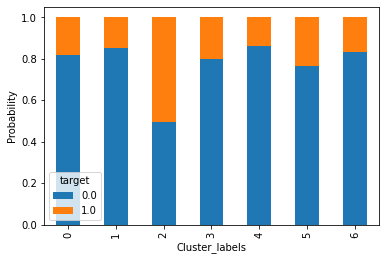

In [35]:
#plottiamo questi risultati
df_und['target'].groupby(kmeans.labels_).value_counts(normalize = True).unstack(1).plot(kind='bar', stacked = True)
plt.xlabel('Cluster_labels')
plt.ylabel('Probability')
plt.show()

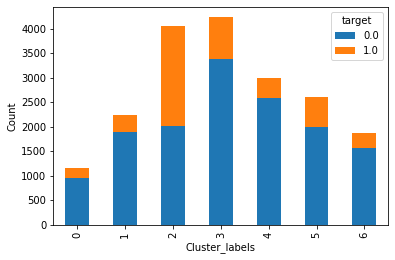

In [54]:
df_und['target'].groupby(kmeans.labels_).value_counts(normalize = False).unstack(1).plot(kind='bar', stacked = True)
plt.xlabel('Cluster_labels')
plt.ylabel('Count')
plt.show()
#barplot che non tiene conto delle dimensioni dei cluster

In [41]:
#a questo punto "analizziamo più nel dettaglio" l'unico cluster che ci interessa, ovvero il cluster 2
df_k[kmeans.labels_==2].describe()

,city_development_index,experience,last_new_job,training_hours
count,4051.000000,4051.000000,4051.000000,4051.000000
mean,0.638700,5.093187,0.981980,55.742286
std,0.058899,3.509425,0.742649,43.609131
min,0.448000,0.500000,0.000000,1.000000
25%,0.624000,3.000000,1.000000,22.000000
50%,0.624000,4.000000,1.000000,44.000000
75%,0.689000,7.000000,1.000000,80.000000
max,0.769000,20.000000,4.000000,264.000000


In [ ]:
alt.Chart(df_k_lab).transform_density('city_development_index',    as_=['city_development_index', 'density'], groupby=['cluster_label']
).mark_area(orient='horizontal').encode(y=alt.Y('city_development_index:Q'), 
    color='cluster_label:N',
    x=alt.X(
        'density:Q',
        stack='center',
        impute=None,
        title=None,
        axis=alt.Axis(labels=False, values=[0],grid=False, ticks=True),
    ),
    column=alt.Column(
        'cluster_label:N',
        header=alt.Header(
            titleOrient='bottom',
            labelOrient='bottom',
            labelPadding=0,
        ),
    )
).properties(
    width=100
).configure_facet(
    spacing=0)

In [ ]:
alt.Chart(df_k_lab).transform_density(
    'experience',
    as_=['experience', 'density'],
#    extent=[5, 50],
   groupby=['cluster_label']
).mark_area(orient='horizontal').encode(
    y=alt.Y('experience:Q'),
    color='cluster_label:N',
    x=alt.X(
        'density:Q',
        stack='center',
        impute=None,
        title=None,
        axis=alt.Axis(labels=False, values=[0],grid=False, ticks=True),
    ),
    column=alt.Column(
        'cluster_label:N',
        header=alt.Header(
            titleOrient='bottom',
            labelOrient='bottom',
            labelPadding=0,
        ),
    )
).properties(
    width=100
).configure_facet(
    spacing=0)

In [ ]:
alt.Chart(df_k_lab).transform_density(
    'last_new_job',
    as_=['last_new_job', 'density'],
#    extent=[5, 50],
   groupby=['cluster_label']
).mark_area(orient='horizontal').encode(
    y=alt.Y('last_new_job:Q'),
    color='cluster_label:N',
    x=alt.X(
        'density:Q',
        stack='center',
        impute=None,
        title=None,
        axis=alt.Axis(labels=False, values=[0],grid=False, ticks=True),
    ),
    column=alt.Column(
        'cluster_label:N',
        header=alt.Header(
            titleOrient='bottom',
            labelOrient='bottom',
            labelPadding=0,
        ),
    )
).properties(
    width=100
).configure_facet(
    spacing=0
).configure_view(
    stroke=None
)

In [ ]:
alt.Chart(df_k_lab).transform_density(
    'training_hours',
    as_=['training_hours', 'density'],
#    extent=[5, 50],
   groupby=['cluster_label']
).mark_area(orient='horizontal').encode(
    y=alt.Y('training_hours:Q'),
    color='cluster_label:N',
    x=alt.X(
        'density:Q',
        stack='center',
        impute=None,
        title=None,
        axis=alt.Axis(labels=False, values=[0],grid=False, ticks=True),
    ),
    column=alt.Column(
        'cluster_label:N',
        header=alt.Header(
            titleOrient='bottom',
            labelOrient='bottom',
            labelPadding=0,
        ),
    )
).properties(
    width=100
).configure_facet(
    spacing=0
).configure_view(
    stroke=None
)

Grafici vecchi

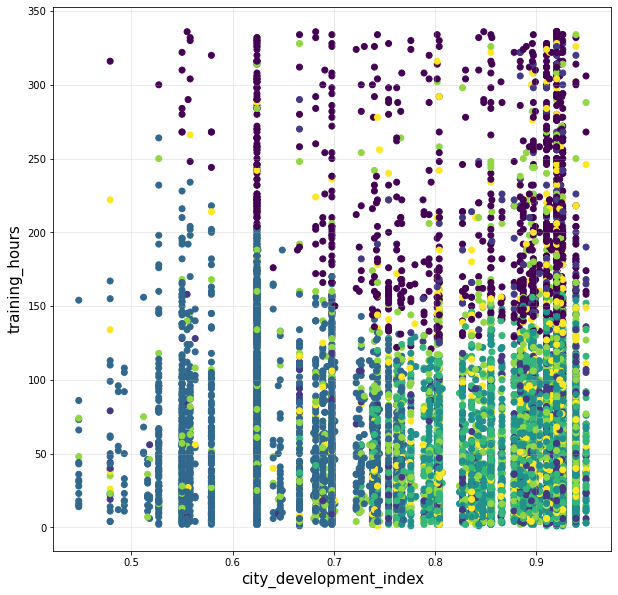

In [46]:
x = 'city_development_index'
y = 'training_hours'

plt.figure(figsize=(10,10))
plt.scatter(df_k[x], df_k[y], c=kmeans.labels_, )

plt.xlabel(x, fontsize=15)
plt.ylabel(y, fontsize=15)
plt.grid(alpha=0.3)
plt.show()

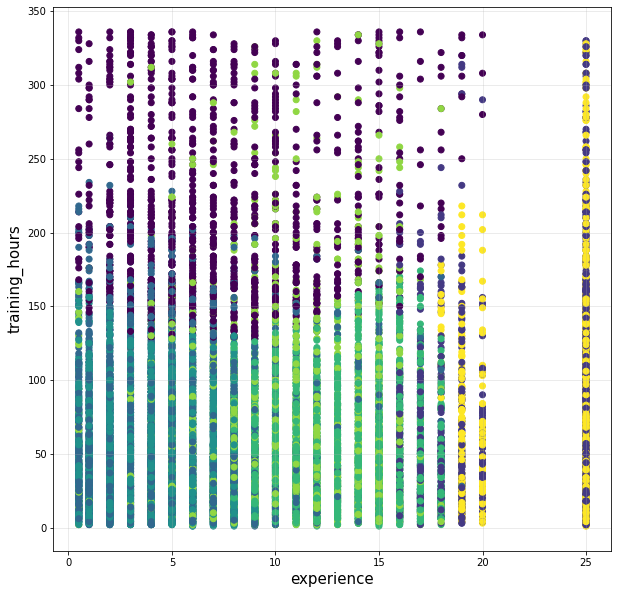

In [47]:
x = 'experience'
y = 'training_hours'

plt.figure(figsize=(10,10))
plt.scatter(df_k[x], df_k[y], c=kmeans.labels_, )

plt.xlabel(x, fontsize=15)
plt.ylabel(y, fontsize=15)
plt.grid(alpha=0.3)
plt.show()

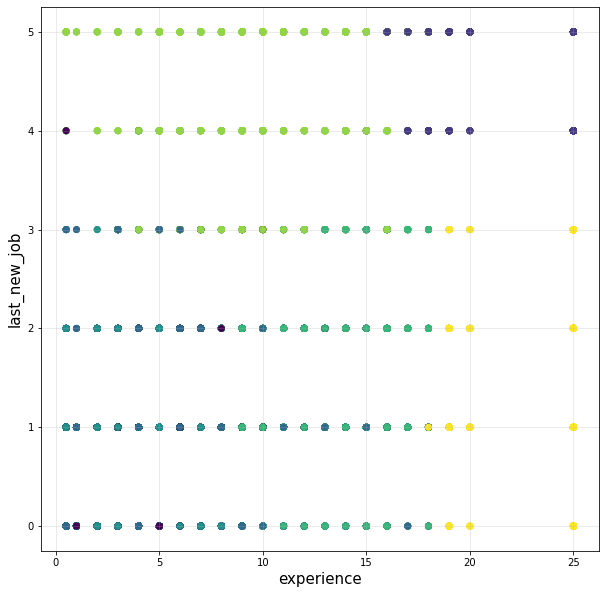

In [48]:
x = 'experience'
y = 'last_new_job'

plt.figure(figsize=(10,10))
plt.scatter(df_k[x], df_k[y], c=kmeans.labels_, )

plt.xlabel(x, fontsize=15)
plt.ylabel(y, fontsize=15)
plt.grid(alpha=0.3)
plt.show()

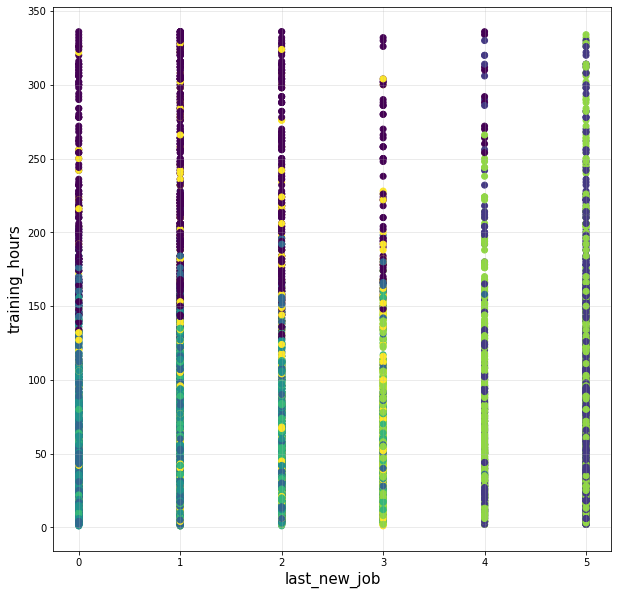

In [49]:
x = 'last_new_job'
y = 'training_hours'

plt.figure(figsize=(10,10))
plt.scatter(df_k[x], df_k[y], c=kmeans.labels_, )

plt.xlabel(x, fontsize=15)
plt.ylabel(y, fontsize=15)
plt.grid(alpha=0.3)
plt.show()

In [ ]:
centers = kmeans.cluster_centers_

plt.figure(figsize=(8, 6))
for i in range(0, len(centers)):
    plt.plot(centers[i], marker='o', label='Cluster %s' % i)
plt.tick_params(axis='both', which='major', labelsize=12)
plt.xticks(range(0, len(df_k.columns)), df_k.columns, fontsize=8)
plt.legend(fontsize=12, ncol=2, bbox_to_anchor=(1.1, 1.05))
plt.show()

 # DB-Scan

In [17]:
df_und['experience'].unique()

array(['>20', '15', '5', '<1', '11', '13', '7', '17', '2', '16', '1', '4',
       '10', '14', '18', '19', '12', '3', '6', '9', '8', '20'],
      dtype=object)

In [18]:
df_und['last_new_job'].unique()

array(['1', '>4', 'never', '4', '3', '2'], dtype=object)

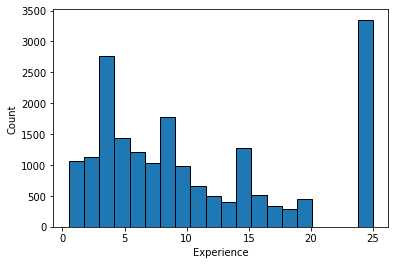

In [19]:
plt.hist(df_k['experience'], bins=20, edgecolor='black')
plt.xlabel('Experience')
plt.ylabel('Count')
plt.show()

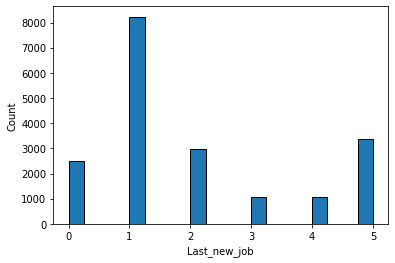

In [20]:
plt.hist(df_k['last_new_job'], bins=20, edgecolor='black')
plt.xlabel('Last_new_job')
plt.ylabel('Count')
plt.show()

In [21]:
df_db=df_und.copy()
df_db=df_db.drop(['enrollee_id', 'city', 'target'], axis=1)

In [22]:
lst=list(df_und['last_new_job'].unique())
dic_job1 = {x: '[2, 4]' if x in ['2', '3', '4']
           else '0' if x == 'never'
           else '1' if x == '1'
           else '>4'
           for x in lst
            }
df_db['last_new_job'] = df_und['last_new_job'].map(dic_job1)

In [23]:
df_db['last_new_job'].unique()

array(['1', '>4', '0', '[2, 4]'], dtype=object)

In [24]:
df_db.head()

,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours
0,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,50-99,Pvt Ltd,1,36
1,0.776,Male,No relevent experience,no_enrollment,Graduate,STEM,15,50-99,Pvt Ltd,>4,47
2,0.624,Male,No relevent experience,Full time course,Graduate,STEM,5,50-99,Pvt Ltd,0,83
3,0.789,Male,No relevent experience,no_enrollment,Graduate,Business Degree,<1,500-999,Pvt Ltd,0,52
4,0.767,Male,Has relevent experience,no_enrollment,Masters,STEM,>20,50-99,Funded Startup,"[2, 4]",8


In [25]:
lst=list(df_und['experience'].unique())
dic_exp = {x: '(0, 5]' if x in ['<1', '1', '2', '3', '4', '5']
           else '(5, 10]' if x in ['6', '7', '8', '9', '10']
           else '(10, 15]' if x in ['11', '12', '13', '14', '15']
           else '(15, 20]' if x in ['16', '17', '18', '19', '20']
           else '>20'
           for x in lst
            }
df_db['experience'] = df_und['experience'].map(dic_exp)

In [26]:
df_db['experience'].unique()

array(['>20', '(10, 15]', '(0, 5]', '(5, 10]', '(15, 20]'], dtype=object)

In [ ]:
#Vecchia versione, ma agiva su df_k del kmeans, meglio agire su df_und e avere il >20 così come abbiamo il >4 in last_new_job
#df_db['experience'] = pd.cut(df_k['experience'], bins=[0,5,10,15,20,25], right=True)

In [27]:
df_db.head()

,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours
0,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,50-99,Pvt Ltd,1,36
1,0.776,Male,No relevent experience,no_enrollment,Graduate,STEM,"(10, 15]",50-99,Pvt Ltd,>4,47
2,0.624,Male,No relevent experience,Full time course,Graduate,STEM,"(0, 5]",50-99,Pvt Ltd,0,83
3,0.789,Male,No relevent experience,no_enrollment,Graduate,Business Degree,"(0, 5]",500-999,Pvt Ltd,0,52
4,0.767,Male,Has relevent experience,no_enrollment,Masters,STEM,>20,50-99,Funded Startup,"[2, 4]",8


In [28]:
pd.cut(df_und['city_development_index'], bins=3).value_counts()

(0.782, 0.949]    13395
(0.615, 0.782]     5038
(0.447, 0.615]      725
Name: city_development_index, dtype: int64

In [29]:
pd.cut(df_und['city_development_index'], bins=3).unique()

[(0.782, 0.949], (0.615, 0.782], (0.447, 0.615]]
Categories (3, interval[float64]): [(0.447, 0.615] < (0.615, 0.782] < (0.782, 0.949]]

In [30]:
city_bin = pd.cut(df_und['city_development_index'], bins=3).unique()
city_dict = {city_bin[2]: 'Low',
             city_bin[1]: 'Medium',
             city_bin[0]: 'High'
             }

df_db['city_development_index'] = df_und['city_development_index'].map(city_dict)
df_db.head()

,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours
0,High,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,50-99,Pvt Ltd,1,36
1,Medium,Male,No relevent experience,no_enrollment,Graduate,STEM,"(10, 15]",50-99,Pvt Ltd,>4,47
2,Medium,Male,No relevent experience,Full time course,Graduate,STEM,"(0, 5]",50-99,Pvt Ltd,0,83
3,High,Male,No relevent experience,no_enrollment,Graduate,Business Degree,"(0, 5]",500-999,Pvt Ltd,0,52
4,Medium,Male,Has relevent experience,no_enrollment,Masters,STEM,>20,50-99,Funded Startup,"[2, 4]",8


In [31]:
pd.cut(df_und['training_hours'], bins=4).value_counts()

(0.665, 84.75]     14075
(84.75, 168.5]      3883
(168.5, 252.25]      788
(252.25, 336.0]      412
Name: training_hours, dtype: int64

In [32]:
df_db['training_hours'] = pd.cut(df_und['training_hours'], bins=4)
df_db.head()

,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours
0,High,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,50-99,Pvt Ltd,1,"(0.665, 84.75]"
1,Medium,Male,No relevent experience,no_enrollment,Graduate,STEM,"(10, 15]",50-99,Pvt Ltd,>4,"(0.665, 84.75]"
2,Medium,Male,No relevent experience,Full time course,Graduate,STEM,"(0, 5]",50-99,Pvt Ltd,0,"(0.665, 84.75]"
3,High,Male,No relevent experience,no_enrollment,Graduate,Business Degree,"(0, 5]",500-999,Pvt Ltd,0,"(0.665, 84.75]"
4,Medium,Male,Has relevent experience,no_enrollment,Masters,STEM,>20,50-99,Funded Startup,"[2, 4]","(0.665, 84.75]"


In [ ]:
#Salvo nella cartella csv
df_db.to_csv('/content/drive/MyDrive/Colab Notebooks/HR_Analytics/csv/HR_Analytics_DBScan.csv', index=False)

## DBScan  con variabili tutte categoriche

In [ ]:
#il dbscan lo proviamo con la jaccard, con variabili tutte categoriche

In [33]:
df_db_all = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/HR_Analytics/csv/HR_Analytics_DBScan.csv', delimiter=',', skipinitialspace=True)
df_db_all.head()

,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours
0,High,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,50-99,Pvt Ltd,1,"(0.665, 84.75]"
1,Medium,Male,No relevent experience,no_enrollment,Graduate,STEM,"(10, 15]",50-99,Pvt Ltd,>4,"(0.665, 84.75]"
2,Medium,Male,No relevent experience,Full time course,Graduate,STEM,"(0, 5]",50-99,Pvt Ltd,0,"(0.665, 84.75]"
3,High,Male,No relevent experience,no_enrollment,Graduate,Business Degree,"(0, 5]",500-999,Pvt Ltd,0,"(0.665, 84.75]"
4,Medium,Male,Has relevent experience,no_enrollment,Masters,STEM,>20,50-99,Funded Startup,"[2, 4]","(0.665, 84.75]"


In [34]:
df_one_all = pd.get_dummies(df_db_all, prefix_sep='=')

In [35]:
df_one_all.head()

,city_development_index=High,city_development_index=Low,city_development_index=Medium,gender=Female,gender=Male,gender=Other,relevent_experience=Has relevent experience,relevent_experience=No relevent experience,enrolled_university=Full time course,enrolled_university=Part time course,enrolled_university=no_enrollment,education_level=Graduate,education_level=High School,education_level=Masters,education_level=Phd,education_level=Primary School,major_discipline=Arts,major_discipline=Business Degree,major_discipline=Humanities,major_discipline=No Discipline,major_discipline=No Major,major_discipline=Other,major_discipline=STEM,"experience=(0, 5]","experience=(10, 15]","experience=(15, 20]","experience=(5, 10]",experience=>20,company_size=10/49,company_size=100-500,company_size=1000-4999,company_size=10000+,company_size=50-99,company_size=500-999,company_size=5000-9999,company_size=<10,company_type=Early Stage Startup,company_type=Funded Startup,company_type=NGO,company_type=Other,company_type=Public Sector,company_type=Pvt Ltd,last_new_job=0,last_new_job=1,last_new_job=>4,"last_new_job=[2, 4]","training_hours=(0.665, 84.75]","training_hours=(168.5, 252.25]","training_hours=(252.25, 336.0]","training_hours=(84.75, 168.5]"
0,1,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0
1,0,0,1,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0
2,0,0,1,0,1,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0
3,1,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0
4,0,0,1,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0


In [36]:
dist_all = pdist(df_one_all.values, 'jaccard')
dist_all = squareform(dist_all)
dist_all

array([[0.        , 0.53333333, 0.625     , ..., 0.16666667, 0.70588235,
        0.70588235],
       [0.53333333, 0.        , 0.42857143, ..., 0.53333333, 0.84210526,
        0.77777778],
       [0.625     , 0.42857143, 0.        , ..., 0.625     , 0.84210526,
        0.77777778],
       ...,
       [0.16666667, 0.53333333, 0.625     , ..., 0.        , 0.625     ,
        0.77777778],
       [0.70588235, 0.84210526, 0.84210526, ..., 0.625     , 0.        ,
        0.53333333],
       [0.70588235, 0.77777778, 0.77777778, ..., 0.77777778, 0.53333333,
        0.        ]])

In [73]:
k = 22
kth_distances_all = list()
for d in dist_all:
    index_kth_distance_all = np.argsort(d)[k-1]
    kth_distances_all.append(d[index_kth_distance_all])

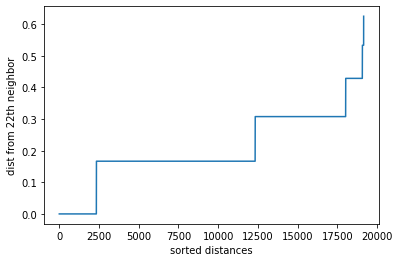

In [74]:
plt.plot(range(0, len(kth_distances_all)), sorted(kth_distances_all))
plt.ylabel('dist from %sth neighbor' % k)
plt.xlabel('sorted distances')
plt.show()

In [75]:
np.unique(np.array(kth_distances_all))

array([0.        , 0.16666667, 0.30769231, 0.42857143, 0.53333333,
       0.625     ])

In [ ]:
#a questo punto scegliamo come epsilon del nostro dbscan 0.166: ho provato ma mi viene un numero infinito di cluster. ho lasciato 0.2.

In [76]:
dbscan_all = DBSCAN(eps=0.17, min_samples=22, metric='jaccard')

In [77]:
dbscan_all.fit(df_one_all.values)

DBSCAN(algorithm='auto', eps=0.17, leaf_size=30, metric='jaccard',
       metric_params=None, min_samples=22, n_jobs=None, p=None)

In [78]:
np.unique(dbscan_all.labels_ , return_counts=True)

(array([-1,  0,  1]), array([ 2343, 14929,  1886]))

In [85]:
#silhouette con tutte categoriche e jaccard
silhouette_score(df_one_all.astype('bool'), dbscan_all.labels_, metric='jaccard')

0.15625458332477124

In [79]:
pd.crosstab(df_und['target'], dbscan_all.labels_) 

col_0,-1,0,1
target,,,
0.0,1665,11165,1551
1.0,678,3764,335


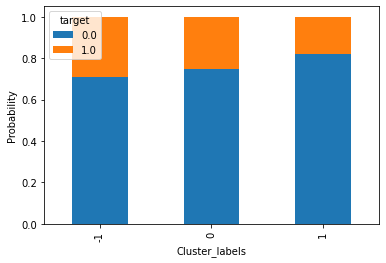

In [81]:
#plottiamo questi risultati
df_und['target'].groupby(dbscan_all.labels_).value_counts(normalize = True).unstack(1).plot(kind='bar', stacked = True)
plt.xlabel('Cluster_labels')
plt.ylabel('Probability')
plt.show()

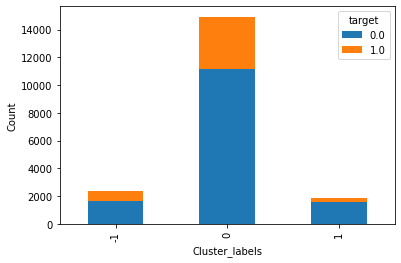

In [83]:
df_und['target'].groupby(dbscan_all.labels_).value_counts(normalize = False).unstack(1).plot(kind='bar', stacked = True)
plt.xlabel('Cluster_labels')
plt.ylabel('Count')
plt.show()

##DBSCAN con solo categoriche (ho escluso le 4 continue)

In [86]:
df_cat = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/HR_Analytics/csv/HR_Analytics_DBScan.csv', delimiter=',', skipinitialspace=True)
df_cat.head()

,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours
0,High,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,50-99,Pvt Ltd,1,"(0.665, 84.75]"
1,Medium,Male,No relevent experience,no_enrollment,Graduate,STEM,"(10, 15]",50-99,Pvt Ltd,>4,"(0.665, 84.75]"
2,Medium,Male,No relevent experience,Full time course,Graduate,STEM,"(0, 5]",50-99,Pvt Ltd,0,"(0.665, 84.75]"
3,High,Male,No relevent experience,no_enrollment,Graduate,Business Degree,"(0, 5]",500-999,Pvt Ltd,0,"(0.665, 84.75]"
4,Medium,Male,Has relevent experience,no_enrollment,Masters,STEM,>20,50-99,Funded Startup,"[2, 4]","(0.665, 84.75]"


In [87]:
df_cat=df_cat.drop(['city_development_index', 'experience', 'last_new_job', 'training_hours'], axis=1)
df_cat.head()

,gender,relevent_experience,enrolled_university,education_level,major_discipline,company_size,company_type
0,Male,Has relevent experience,no_enrollment,Graduate,STEM,50-99,Pvt Ltd
1,Male,No relevent experience,no_enrollment,Graduate,STEM,50-99,Pvt Ltd
2,Male,No relevent experience,Full time course,Graduate,STEM,50-99,Pvt Ltd
3,Male,No relevent experience,no_enrollment,Graduate,Business Degree,500-999,Pvt Ltd
4,Male,Has relevent experience,no_enrollment,Masters,STEM,50-99,Funded Startup


In [88]:
df_one_cat = pd.get_dummies(df_cat, prefix_sep='=')

In [89]:
df_one_cat.head()

,gender=Female,gender=Male,gender=Other,relevent_experience=Has relevent experience,relevent_experience=No relevent experience,enrolled_university=Full time course,enrolled_university=Part time course,enrolled_university=no_enrollment,education_level=Graduate,education_level=High School,education_level=Masters,education_level=Phd,education_level=Primary School,major_discipline=Arts,major_discipline=Business Degree,major_discipline=Humanities,major_discipline=No Discipline,major_discipline=No Major,major_discipline=Other,major_discipline=STEM,company_size=10/49,company_size=100-500,company_size=1000-4999,company_size=10000+,company_size=50-99,company_size=500-999,company_size=5000-9999,company_size=<10,company_type=Early Stage Startup,company_type=Funded Startup,company_type=NGO,company_type=Other,company_type=Public Sector,company_type=Pvt Ltd
0,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1
1,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1
2,0,1,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1
3,0,1,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
4,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0


In [90]:
dist_cat = pdist(df_one_cat.values, 'jaccard')
dist_cat = squareform(dist_cat)
dist_cat

array([[0.        , 0.25      , 0.44444444, ..., 0.        , 0.6       ,
        0.72727273],
       [0.25      , 0.        , 0.25      , ..., 0.25      , 0.72727273,
        0.6       ],
       [0.44444444, 0.25      , 0.        , ..., 0.44444444, 0.83333333,
        0.72727273],
       ...,
       [0.        , 0.25      , 0.44444444, ..., 0.        , 0.6       ,
        0.72727273],
       [0.6       , 0.72727273, 0.83333333, ..., 0.6       , 0.        ,
        0.6       ],
       [0.72727273, 0.6       , 0.72727273, ..., 0.72727273, 0.6       ,
        0.        ]])

In [91]:
k = 14
kth_distances_cat = list()
for d in dist_cat:
    index_kth_distance_cat = np.argsort(d)[k-1]
    kth_distances_cat.append(d[index_kth_distance_cat])

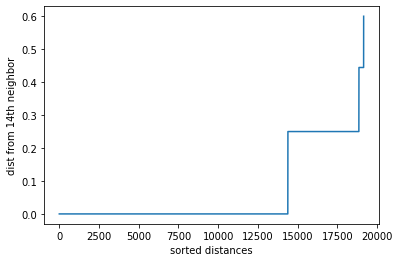

In [92]:
plt.plot(range(0, len(kth_distances_cat)), sorted(kth_distances_cat))
plt.ylabel('dist from %sth neighbor' % k)
plt.xlabel('sorted distances')
plt.show()

In [93]:
np.unique(np.array(kth_distances_cat))

array([0.        , 0.25      , 0.44444444, 0.6       ])

In [94]:
dbscan_cat = DBSCAN(eps=0.26, min_samples=14, metric='jaccard')

In [95]:
dbscan_cat.fit(df_one_cat.values)

DBSCAN(algorithm='auto', eps=0.26, leaf_size=30, metric='jaccard',
       metric_params=None, min_samples=14, n_jobs=None, p=None)

In [101]:
#silhouette con solo categoriche (senza 4 continue)
silhouette_score(df_one_cat.astype('bool'), dbscan_cat.labels_, metric='jaccard')

0.2899812672083093

In [96]:
np.unique(dbscan_cat.labels_ , return_counts=True)

(array([-1,  0,  1]), array([   31, 16749,  2378]))

In [97]:
pd.crosstab(df_und['target'], dbscan_cat.labels_) 

col_0,-1,0,1
target,,,
0.0,23,12424,1934
1.0,8,4325,444


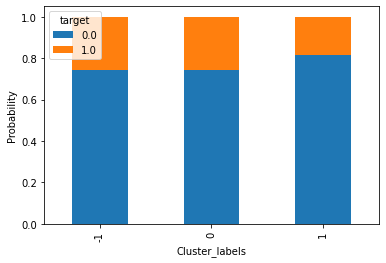

In [99]:
#plottiamo questi risultati
df_und['target'].groupby(dbscan_cat.labels_).value_counts(normalize = True).unstack(1).plot(kind='bar', stacked = True)
plt.xlabel('Cluster_labels')
plt.ylabel('Probability')
plt.show()

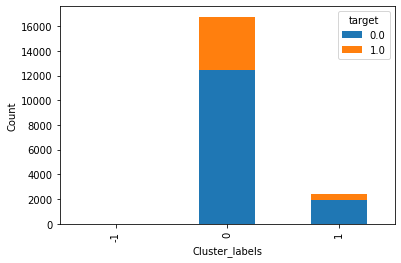

In [100]:
df_und['target'].groupby(dbscan_cat.labels_).value_counts(normalize = False).unstack(1).plot(kind='bar', stacked = True)
plt.xlabel('Cluster_labels')
plt.ylabel('Count')
plt.show()

##DBSCAN 4 var continue

In [ ]:
#Qui X sono le 4 variabili continue utilizzate già per il kmeans e sono già normlaizzate nell'intervallo [0,1]

In [37]:
df_k = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/HR_Analytics/csv/HR_Analytics_KMeans.csv', delimiter=',', skipinitialspace=True)
df_k.head()

,city_development_index,experience,last_new_job,training_hours
0,0.920,25.0,1,36
1,0.776,15.0,5,47
2,0.624,5.0,0,83
3,0.789,0.5,0,52
4,0.767,25.0,4,8


In [38]:
scaler = MinMaxScaler()

X = scaler.fit_transform(df_k.values)
X

array([[0.94211577, 1.        , 0.2       , 0.10447761],
       [0.65469062, 0.59183673, 1.        , 0.13731343],
       [0.35129741, 0.18367347, 0.        , 0.24477612],
       ...,
       [0.94211577, 1.        , 0.8       , 0.12835821],
       [0.70658683, 0.        , 0.4       , 0.28656716],
       [0.81237525, 0.06122449, 0.2       , 0.3761194 ]])

In [39]:
dist = pdist(X, 'euclidean')
dist = squareform(dist)
dist

array([[0.        , 0.94355109, 1.0368891 , ..., 0.60047505, 1.06237022,
        0.9858607 ],
       [0.94355109, 0.        , 1.12702836, ..., 0.53785748, 0.85746173,
        1.00171957],
       [1.0368891 , 1.12702836, 0.        , ..., 1.29190111, 0.5671975 ,
        0.53370178],
       ...,
       [0.60047505, 0.53785748, 1.29190111, ..., 0.        , 1.11377913,
        1.1487026 ],
       [1.06237022, 0.85746173, 0.5671975 , ..., 1.11377913, 0.        ,
        0.25091678],
       [0.9858607 , 1.00171957, 0.53370178, ..., 1.1487026 , 0.25091678,
        0.        ]])

In [105]:
k = 8
kth_distances = list()
for d in dist:
    index_kth_distance = np.argsort(d)[k]
    kth_distances.append(d[index_kth_distance])

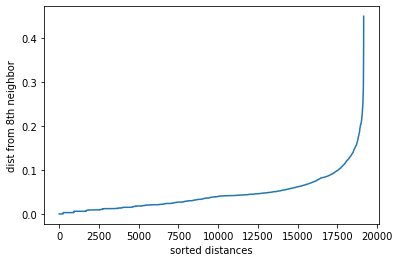

In [106]:
plt.plot(range(0, len(kth_distances)), sorted(kth_distances))
plt.ylabel('dist from %sth neighbor' % k)
plt.xlabel('sorted distances')
plt.show()

In [40]:
dbscan = DBSCAN(eps=0.2, min_samples=8, metric='euclidean')

In [41]:
dbscan.fit(X)

DBSCAN(algorithm='auto', eps=0.2, leaf_size=30, metric='euclidean',
       metric_params=None, min_samples=8, n_jobs=None, p=None)

In [42]:
#silhouette con solo 4 continue
silhouette_score(X, dbscan.labels_, metric='euclidean')

0.33696704586686094

In [111]:
np.unique(dbscan.labels_ , return_counts=True)

(array([-1,  0,  1,  2,  3]), array([   63,  1414,  3519, 12253,  1909]))

In [112]:
pd.crosstab(df_und['target'], dbscan.labels_) 

col_0,-1,0,1,2,3
target,,,,,
0.0,43,1176,2699,8833,1630
1.0,20,238,820,3420,279


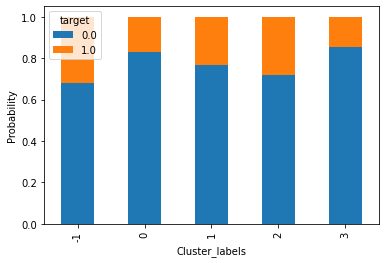

In [114]:
#plottiamo questi risultati
df_und['target'].groupby(dbscan.labels_).value_counts(normalize = True).unstack(1).plot(kind='bar', stacked = True)
plt.xlabel('Cluster_labels')
plt.ylabel('Probability')
plt.show()

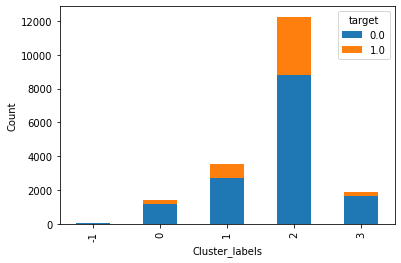

In [115]:
df_und['target'].groupby(dbscan.labels_).value_counts(normalize = False).unstack(1).plot(kind='bar', stacked = True)
plt.xlabel('Cluster_labels')
plt.ylabel('Count')
plt.show()

In [ ]:
#potremmo vedere cosa c'è in questo cluster 2

In [139]:
df_dbscan_lab=df_k.copy()
df_dbscan_lab['cluster_label'] = dbscan.labels_
df_dbscan_lab.head()

,city_development_index,experience,last_new_job,training_hours,cluster_label
0,0.920,25.0,1,36,0
1,0.776,15.0,5,47,1
2,0.624,5.0,0,83,2
3,0.789,0.5,0,52,2
4,0.767,25.0,4,8,3


In [ ]:
df_dbscan_lab[dbscan.labels_==2].describe()

In [ ]:
alt.Chart(df_dbscan_lab).transform_density('city_development_index',    as_=['city_development_index', 'density'], groupby=['cluster_label']
).mark_area(orient='horizontal').encode(y=alt.Y('city_development_index:Q'), 
    color='cluster_label:N',
    x=alt.X(
        'density:Q',
        stack='center',
        impute=None,
        title=None,
        axis=alt.Axis(labels=False, values=[0],grid=False, ticks=True),
    ),
    column=alt.Column(
        'cluster_label:N',
        header=alt.Header(
            titleOrient='bottom',
            labelOrient='bottom',
            labelPadding=0,
        ),
    )
).properties(
    width=100
).configure_facet(
    spacing=0)

In [ ]:
alt.Chart(df_dbscan_lab).transform_density(
    'experience',
    as_=['experience', 'density'],
#    extent=[5, 50],
   groupby=['cluster_label']
).mark_area(orient='horizontal').encode(
    y=alt.Y('experience:Q'),
    color='cluster_label:N',
    x=alt.X(
        'density:Q',
        stack='center',
        impute=None,
        title=None,
        axis=alt.Axis(labels=False, values=[0],grid=False, ticks=True),
    ),
    column=alt.Column(
        'cluster_label:N',
        header=alt.Header(
            titleOrient='bottom',
            labelOrient='bottom',
            labelPadding=0,
        ),
    )
).properties(
    width=100
).configure_facet(
    spacing=0)

In [ ]:
alt.Chart(df_dbscan_lab).transform_density(
    'last_new_job',
    as_=['last_new_job', 'density'],
#    extent=[5, 50],
   groupby=['cluster_label']
).mark_area(orient='horizontal').encode(
    y=alt.Y('last_new_job:Q'),
    color='cluster_label:N',
    x=alt.X(
        'density:Q',
        stack='center',
        impute=None,
        title=None,
        axis=alt.Axis(labels=False, values=[0],grid=False, ticks=True),
    ),
    column=alt.Column(
        'cluster_label:N',
        header=alt.Header(
            titleOrient='bottom',
            labelOrient='bottom',
            labelPadding=0,
        ),
    )
).properties(
    width=100
).configure_facet(
    spacing=0
).configure_view(
    stroke=None
)

In [ ]:
alt.Chart(df_dbscan_lab).transform_density(
    'training_hours',
    as_=['training_hours', 'density'],
#    extent=[5, 50],
   groupby=['cluster_label']
).mark_area(orient='horizontal').encode(
    y=alt.Y('training_hours:Q'),
    color='cluster_label:N',
    x=alt.X(
        'density:Q',
        stack='center',
        impute=None,
        title=None,
        axis=alt.Axis(labels=False, values=[0],grid=False, ticks=True),
    ),
    column=alt.Column(
        'cluster_label:N',
        header=alt.Header(
            titleOrient='bottom',
            labelOrient='bottom',
            labelPadding=0,
        ),
    )
).properties(
    width=100
).configure_facet(
    spacing=0
).configure_view(
    stroke=None
)

In [ ]:
#levare cluster -1???

# Hierarchical Clustering

In [122]:
from scipy.stats import mode 
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage,dendrogram,fcluster
from sklearn.metrics import silhouette_score

## Variabili Continue

In [123]:
df_k = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/HR_Analytics/csv/HR_Analytics_KMeans.csv', delimiter=',', skipinitialspace=True)
df_k.head()

,city_development_index,experience,last_new_job,training_hours
0,0.920,25.0,1,36
1,0.776,15.0,5,47
2,0.624,5.0,0,83
3,0.789,0.5,0,52
4,0.767,25.0,4,8


In [124]:
df_h1=df_k.copy() #solo variabili numeriche 

In [125]:
df_h1.head()

,city_development_index,experience,last_new_job,training_hours
0,0.920,25.0,1,36
1,0.776,15.0,5,47
2,0.624,5.0,0,83
3,0.789,0.5,0,52
4,0.767,25.0,4,8


In [126]:
scaler2=MinMaxScaler()
Xs2=scaler2.fit_transform(df_h1.values)

Calcolo le varie metriche per il calcolo della matrice di prossimità e seleziono la migliore:

In [127]:
D = pdist(Xs2, metric='euclidean')

In [ ]:
method=['single','complete','average','weighted','centroid','median','ward']
for i in method:
  data_link=linkage(D, method=i, metric='euclidean')
  labels=fcluster(data_link, t=5, criterion='maxclust')
  print('silhouette score for method %s is: %f, number of clusters is: %g' %(i, silhouette_score(Xs2,labels), max(labels)))

silhouette score for method single is: 0.213804, number of clusters is: 5
silhouette score for method complete is: 0.302309, number of clusters is: 5
silhouette score for method average is: 0.300811, number of clusters is: 5
silhouette score for method weighted is: 0.181769, number of clusters is: 5
silhouette score for method centroid is: 0.313918, number of clusters is: 5
silhouette score for method median is: 0.295018, number of clusters is: 4
silhouette score for method ward is: 0.321858, number of clusters is: 5


In [128]:
data_link = linkage(D , method='ward', metric='euclidean')

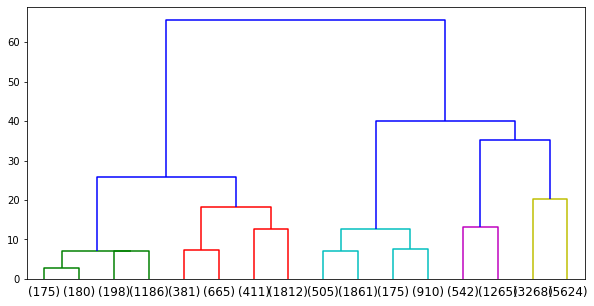

In [129]:
plt.figure(figsize=(10,5))
res=dendrogram(data_link, color_threshold=21, truncate_mode='level', p=3) #taglio a 3 livelli

In [130]:
labels_cont = fcluster(data_link, t=5, criterion='maxclust' )
max(labels_cont)

5

In [131]:
silhouette_score(Xs2, labels_cont)

0.3218580198518497

In [132]:
pd.crosstab(df_und['target'], labels_cont) 

col_0,1,2,3,4,5
target,,,,,
0.0,1484,2504,1609,1450,7334
1.0,255,765,1842,357,1558


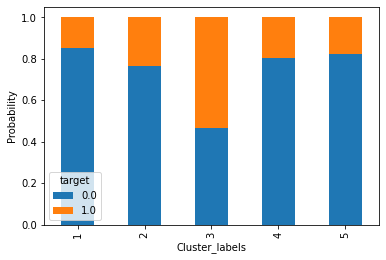

In [135]:
df_und['target'].groupby(labels_cont).value_counts(normalize = True).unstack(1).plot(kind='bar', stacked = True)
plt.xlabel('Cluster_labels')
plt.ylabel('Probability')
plt.show()

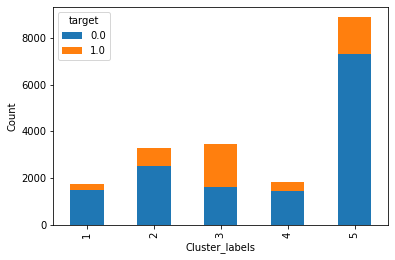

In [136]:
df_und['target'].groupby(labels_cont).value_counts(normalize = False).unstack(1).plot(kind='bar', stacked = True)
plt.xlabel('Cluster_labels')
plt.ylabel('Count')
plt.show()

In [ ]:
#Analizziamo il Cluster 3

In [143]:
df_h1_lab=df_h1.copy()
df_h1_lab['cluster_label'] = labels_cont
df_h1_lab.head()

,city_development_index,experience,last_new_job,training_hours,cluster_label
0,0.920,25.0,1,36,4
1,0.776,15.0,5,47,2
2,0.624,5.0,0,83,3
3,0.789,0.5,0,52,5
4,0.767,25.0,4,8,1


In [144]:
df_h1_lab[labels_cont==3].describe()

,city_development_index,experience,last_new_job,training_hours,cluster_label
count,3451.000000,3451.000000,3451.000000,3451.000000,3451.0
mean,0.625675,4.840336,0.973631,70.169516,3.0
std,0.049286,3.116856,0.666942,66.163123,0.0
min,0.448000,0.500000,0.000000,1.000000,3.0
25%,0.624000,2.000000,1.000000,23.000000,3.0
50%,0.624000,4.000000,1.000000,48.000000,3.0
75%,0.624000,7.000000,1.000000,96.000000,3.0
max,0.843000,19.000000,4.000000,336.000000,3.0


In [145]:
alt.Chart(df_h1_lab).transform_density('city_development_index',    as_=['city_development_index', 'density'], groupby=['cluster_label']
).mark_area(orient='horizontal').encode(y=alt.Y('city_development_index:Q'), 
    color='cluster_label:N',
    x=alt.X(
        'density:Q',
        stack='center',
        impute=None,
        title=None,
        axis=alt.Axis(labels=False, values=[0],grid=False, ticks=True),
    ),
    column=alt.Column(
        'cluster_label:N',
        header=alt.Header(
            titleOrient='bottom',
            labelOrient='bottom',
            labelPadding=0,
        ),
    )
).properties(
    width=100
).configure_facet(
    spacing=0)

alt.Chart(...)

In [146]:
alt.Chart(df_h1_lab).transform_density(
    'experience',
    as_=['experience', 'density'],
#    extent=[5, 50],
   groupby=['cluster_label']
).mark_area(orient='horizontal').encode(
    y=alt.Y('experience:Q'),
    color='cluster_label:N',
    x=alt.X(
        'density:Q',
        stack='center',
        impute=None,
        title=None,
        axis=alt.Axis(labels=False, values=[0],grid=False, ticks=True),
    ),
    column=alt.Column(
        'cluster_label:N',
        header=alt.Header(
            titleOrient='bottom',
            labelOrient='bottom',
            labelPadding=0,
        ),
    )
).properties(
    width=100
).configure_facet(
    spacing=0)

alt.Chart(...)

In [147]:
alt.Chart(df_h1_lab).transform_density(
    'last_new_job',
    as_=['last_new_job', 'density'],
#    extent=[5, 50],
   groupby=['cluster_label']
).mark_area(orient='horizontal').encode(
    y=alt.Y('last_new_job:Q'),
    color='cluster_label:N',
    x=alt.X(
        'density:Q',
        stack='center',
        impute=None,
        title=None,
        axis=alt.Axis(labels=False, values=[0],grid=False, ticks=True),
    ),
    column=alt.Column(
        'cluster_label:N',
        header=alt.Header(
            titleOrient='bottom',
            labelOrient='bottom',
            labelPadding=0,
        ),
    )
).properties(
    width=100
).configure_facet(
    spacing=0
).configure_view(
    stroke=None
)

alt.Chart(...)

In [148]:
alt.Chart(df_h1_lab).transform_density(
    'training_hours',
    as_=['training_hours', 'density'],
#    extent=[5, 50],
   groupby=['cluster_label']
).mark_area(orient='horizontal').encode(
    y=alt.Y('training_hours:Q'),
    color='cluster_label:N',
    x=alt.X(
        'density:Q',
        stack='center',
        impute=None,
        title=None,
        axis=alt.Axis(labels=False, values=[0],grid=False, ticks=True),
    ),
    column=alt.Column(
        'cluster_label:N',
        header=alt.Header(
            titleOrient='bottom',
            labelOrient='bottom',
            labelPadding=0,
        ),
    )
).properties(
    width=100
).configure_facet(
    spacing=0
).configure_view(
    stroke=None
)

alt.Chart(...)

## Variabili tutte categoriche

In [153]:
df_db = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/HR_Analytics/csv/HR_Analytics_DBScan.csv', delimiter=',', skipinitialspace=True)
df_db.head()

,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours
0,High,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,50-99,Pvt Ltd,1,"(0.665, 84.75]"
1,Medium,Male,No relevent experience,no_enrollment,Graduate,STEM,"(10, 15]",50-99,Pvt Ltd,>4,"(0.665, 84.75]"
2,Medium,Male,No relevent experience,Full time course,Graduate,STEM,"(0, 5]",50-99,Pvt Ltd,0,"(0.665, 84.75]"
3,High,Male,No relevent experience,no_enrollment,Graduate,Business Degree,"(0, 5]",500-999,Pvt Ltd,0,"(0.665, 84.75]"
4,Medium,Male,Has relevent experience,no_enrollment,Masters,STEM,>20,50-99,Funded Startup,"[2, 4]","(0.665, 84.75]"


In [154]:
df_h2=df_db.copy() # secondo tentativo tutte categoriche 
df_h2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19158 entries, 0 to 19157
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   city_development_index  19158 non-null  object
 1   gender                  19158 non-null  object
 2   relevent_experience     19158 non-null  object
 3   enrolled_university     19158 non-null  object
 4   education_level         19158 non-null  object
 5   major_discipline        19158 non-null  object
 6   experience              19158 non-null  object
 7   company_size            19158 non-null  object
 8   company_type            19158 non-null  object
 9   last_new_job            19158 non-null  object
 10  training_hours          19158 non-null  object
dtypes: object(11)
memory usage: 1.6+ MB


In [155]:
df_one_hot = pd.get_dummies(df_h2, prefix_sep='=').astype('bool')

In [156]:
df_one_hot.head()

,city_development_index=High,city_development_index=Low,city_development_index=Medium,gender=Female,gender=Male,gender=Other,relevent_experience=Has relevent experience,relevent_experience=No relevent experience,enrolled_university=Full time course,enrolled_university=Part time course,enrolled_university=no_enrollment,education_level=Graduate,education_level=High School,education_level=Masters,education_level=Phd,education_level=Primary School,major_discipline=Arts,major_discipline=Business Degree,major_discipline=Humanities,major_discipline=No Discipline,major_discipline=No Major,major_discipline=Other,major_discipline=STEM,"experience=(0, 5]","experience=(10, 15]","experience=(15, 20]","experience=(5, 10]",experience=>20,company_size=10/49,company_size=100-500,company_size=1000-4999,company_size=10000+,company_size=50-99,company_size=500-999,company_size=5000-9999,company_size=<10,company_type=Early Stage Startup,company_type=Funded Startup,company_type=NGO,company_type=Other,company_type=Public Sector,company_type=Pvt Ltd,last_new_job=0,last_new_job=1,last_new_job=>4,"last_new_job=[2, 4]","training_hours=(0.665, 84.75]","training_hours=(168.5, 252.25]","training_hours=(252.25, 336.0]","training_hours=(84.75, 168.5]"
0,True,False,False,False,True,False,True,False,False,False,True,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,True,False,False,True,False,False,False
1,False,False,True,False,True,False,False,True,False,False,True,True,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,True,False,True,False,False,False
2,False,False,True,False,True,False,False,True,True,False,False,True,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,True,False,False,False,True,False,False,False
3,True,False,False,False,True,False,False,True,False,False,True,True,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,True,True,False,False,False,True,False,False,False
4,False,False,True,False,True,False,True,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,True,True,False,False,False


 Calcolo le varie metriche per il calcolo della matrice di prossimità e seleziono la migliore:

In [157]:
D = pdist(df_one_hot, metric='jaccard') #calcolo matrice delle distanze utilizzando una jaccard

In [ ]:
method=['average','weighted','centroid','ward']
for i in method:
  data_link1=linkage(D, method=i, metric='jaccard')
  labels=fcluster(data_link1, t=5, criterion='maxclust')
  print('silhouette score for method %s is: %f, number of clusters is: %g'%(i,silhouette_score(df_one_hot, labels, metric='jaccard'),max(labels)))


silhouette score for method average is: 0.105736, number of clusters is: 5
silhouette score for method weighted is: 0.061487, number of clusters is: 5
silhouette score for method centroid is: 0.129874, number of clusters is: 5
silhouette score for method ward is: 0.092354, number of clusters is: 5


In [158]:
data_link1 = linkage(D, method='ward', metric='jaccard') #distanza jaccard con variabili categoriche

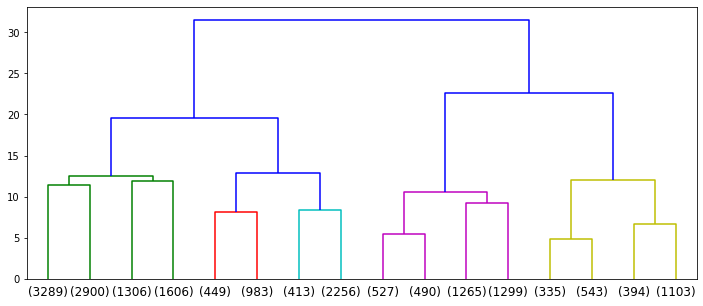

In [159]:
plt.figure(figsize=(12,5))
res1=dendrogram(data_link1,color_threshold=12.7, truncate_mode='level', p=3) #taglio a 3 livelli

In [160]:
labels_cat=fcluster(data_link1, t=5, criterion='maxclust')
max(labels_cat)

5

In [161]:
silhouette_score(df_one_hot, labels_cat, metric='jaccard')

0.09235361796077682

In [162]:
pd.crosstab(df_und['target'], labels_cat)

col_0,1,2,3,4,5
target,,,,,
0.0,7710,989,1594,2160,1928
1.0,1391,443,1075,1421,447


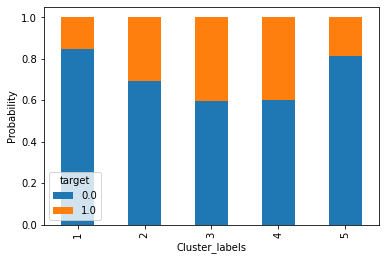

In [165]:
df_und['target'].groupby(labels_cat).value_counts(normalize = True).unstack(1).plot(kind='bar', stacked = True)
plt.xlabel('Cluster_labels')
plt.ylabel('Probability')
plt.show()

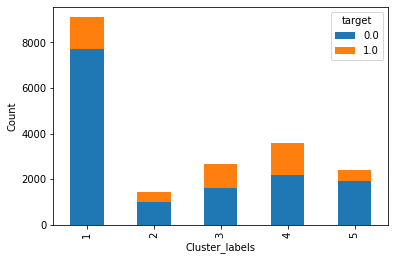

In [166]:
df_und['target'].groupby(labels_cat).value_counts(normalize = False).unstack(1).plot(kind='bar', stacked = True)
plt.xlabel('Cluster_labels')
plt.ylabel('Count')
plt.show()